# Solar Radiation Measurement

## Business Objective
The business objective is to identify high-potential regions for solar installation that align with the company's long-term sustainability goals. This requires analyzing environmental data to pinpoint areas where solar energy potential is highest, which will support data-driven decisions for future solar installations.


### Overview (Data Understanding)
Understanding the given datasets

In [1]:
#import necessary libraries
import pandas as pd
import numpy as np
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
import os
import warnings
warnings.filterwarnings('ignore')


In [2]:
# import the CSV file 
# Define the path to the CSV file

file_path = '../data/sierraleone-bumbuna.csv'
data = pd.read_csv(file_path)


In [3]:
data.head()

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
0,2021-10-30 00:01,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.1,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
1,2021-10-30 00:02,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
2,2021-10-30 00:03,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
3,2021-10-30 00:04,-0.7,0.0,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.1,22.3,22.6,NaN
4,2021-10-30 00:05,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN


In [4]:
# print the no. of rows and no. of columns of the dataframe
data.shape

(525600, 19)

In [5]:
#It shows the name of each column
data.columns

Index(['Timestamp', 'GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'Tamb', 'RH', 'WS',
       'WSgust', 'WSstdev', 'WD', 'WDstdev', 'BP', 'Cleaning', 'Precipitation',
       'TModA', 'TModB', 'Comments'],
      dtype='object')

In [6]:
#Provides basic information about the dataframe.  
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 525600 entries, 0 to 525599
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Timestamp      525600 non-null  object 
 1   GHI            525600 non-null  float64
 2   DNI            525600 non-null  float64
 3   DHI            525600 non-null  float64
 4   ModA           525600 non-null  float64
 5   ModB           525600 non-null  float64
 6   Tamb           525600 non-null  float64
 7   RH             525600 non-null  float64
 8   WS             525600 non-null  float64
 9   WSgust         525600 non-null  float64
 10  WSstdev        525600 non-null  float64
 11  WD             525600 non-null  float64
 12  WDstdev        525600 non-null  float64
 13  BP             525600 non-null  int64  
 14  Cleaning       525600 non-null  int64  
 15  Precipitation  525600 non-null  float64
 16  TModA          525600 non-null  float64
 17  TModB          525600 non-nul

In [7]:
#Find out all the Null Values in the data.
data.isna().sum()

Timestamp             0
GHI                   0
DNI                   0
DHI                   0
ModA                  0
ModB                  0
Tamb                  0
RH                    0
WS                    0
WSgust                0
WSstdev               0
WD                    0
WDstdev               0
BP                    0
Cleaning              0
Precipitation         0
TModA                 0
TModB                 0
Comments         525600
dtype: int64

## Calculate Summary Statistics

In [8]:
data.describe()

,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
count,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,0.0
mean,201.957515,116.376337,113.720571,206.643095,198.114691,26.319394,79.448857,1.146113,1.691606,0.363823,133.044668,7.172220,999.876469,0.000967,0.004806,32.504263,32.593091,NaN
std,298.495150,218.652659,158.946032,300.896893,288.889073,4.398605,20.520775,1.239248,1.617053,0.295000,114.284792,7.535093,2.104419,0.031074,0.047556,12.434899,12.009161,NaN
min,-19.500000,-7.800000,-17.900000,0.000000,0.000000,12.300000,9.900000,0.000000,0.000000,0.000000,0.000000,0.000000,993.000000,0.000000,0.000000,10.700000,11.100000,NaN
25%,-2.800000,-0.300000,-3.800000,0.000000,0.000000,23.100000,68.700000,0.000000,0.000000,0.000000,0.000000,0.000000,999.000000,0.000000,0.000000,23.500000,23.800000,NaN
50%,0.300000,-0.100000,-0.100000,3.600000,3.400000,25.300000,85.400000,0.800000,1.600000,0.400000,161.500000,6.200000,1000.000000,0.000000,0.000000,26.600000,26.900000,NaN
75%,362.400000,107.000000,224.700000,359.500000,345.400000,29.400000,96.700000,2.000000,2.600000,0.600000,234.100000,12.000000,1001.000000,0.000000,0.000000,40.900000,41.300000,NaN
max,1499.000000,946.000000,892.000000,1507.000000,1473.000000,39.900000,100.000000,19.200000,23.900000,4.100000,360.000000,98.400000,1006.000000,1.000000,2.400000,72.800000,70.400000,NaN


## Data Quality Check

In [9]:
# Check for Missing Values:
data.isnull().sum()

Timestamp             0
GHI                   0
DNI                   0
DHI                   0
ModA                  0
ModB                  0
Tamb                  0
RH                    0
WS                    0
WSgust                0
WSstdev               0
WD                    0
WDstdev               0
BP                    0
Cleaning              0
Precipitation         0
TModA                 0
TModB                 0
Comments         525600
dtype: int64

In [10]:
# Check for Incorrect Entries
incorrect_entries = data[(data['GHI'] < 0) | (data['DNI'] < 0) | (data['DHI'] < 0) |
                       (data['ModA'] < 0) | (data['ModB'] < 0) | (data['WS'] < 0) | 
                       (data['WSgust'] < 0)]
print(incorrect_entries)


               Timestamp  GHI  DNI  DHI  ModA  ModB  Tamb     RH   WS  WSgust  \
0       2021-10-30 00:01 -0.7 -0.1 -0.8   0.0   0.0  21.9   99.1  0.0     0.0   
1       2021-10-30 00:02 -0.7 -0.1 -0.8   0.0   0.0  21.9   99.2  0.0     0.0   
2       2021-10-30 00:03 -0.7 -0.1 -0.8   0.0   0.0  21.9   99.2  0.0     0.0   
3       2021-10-30 00:04 -0.7  0.0 -0.8   0.0   0.0  21.9   99.3  0.0     0.0   
4       2021-10-30 00:05 -0.7 -0.1 -0.8   0.0   0.0  21.9   99.3  0.0     0.0   
...                  ...  ...  ...  ...   ...   ...   ...    ...  ...     ...   
525595  2022-10-29 23:56 -1.6 -0.1 -2.9   0.0   0.0  24.0  100.0  0.0     0.0   
525596  2022-10-29 23:57 -1.7 -0.1 -3.0   0.0   0.0  24.0  100.0  0.0     0.0   
525597  2022-10-29 23:58 -1.7 -0.1 -3.1   0.0   0.0  24.0  100.0  0.0     0.0   
525598  2022-10-29 23:59 -1.7 -0.2 -3.3   0.0   0.0  23.9  100.0  0.0     0.0   
525599  2022-10-30 00:00 -1.7 -0.1 -3.4   0.0   0.0  23.9  100.0  0.0     0.0   

        WSstdev   WD  WDstd

In [11]:
# Identify Outliers
from scipy import stats
z_scores = np.abs(stats.zscore(data[['ModA', 'ModB', 'WS', 'WSgust']]))
outliers = data[(z_scores > 3).any(axis=1)]
print(outliers)

               Timestamp     GHI    DNI    DHI    ModA    ModB  Tamb    RH  \
662     2021-10-30 11:03  1071.0  616.0  539.1  1142.0  1116.0  26.4  82.5   
663     2021-10-30 11:04  1119.0  673.5  538.4  1193.0  1167.0  26.3  83.1   
670     2021-10-30 11:11  1092.0  667.1  507.6  1163.0  1137.0  27.0  83.4   
671     2021-10-30 11:12  1154.0  755.7  491.3  1237.0  1208.0  27.0  82.4   
672     2021-10-30 11:13  1063.0  665.2  478.0  1132.0  1105.0  27.1  80.1   
...                  ...     ...    ...    ...     ...     ...   ...   ...   
522184  2022-10-27 15:05   167.2   -0.5  165.1   167.6   160.9  30.4  68.3   
522185  2022-10-27 15:06   163.4   -0.6  161.0   165.7   159.2  30.2  67.7   
522194  2022-10-27 15:15   183.5    0.3  181.6   173.7   168.7  29.3  70.2   
523792  2022-10-28 17:53    31.3   -0.5   30.2    34.3    32.3  28.4  79.5   
523794  2022-10-28 17:55    22.8   -0.8   21.4    26.5    25.0  27.9  80.4   

         WS  WSgust  WSstdev     WD  WDstdev    BP  Cleaning  P

In [12]:
# Using IQR (Interquartile Range)
Q1 = data[['ModA', 'ModB', 'WS', 'WSgust']].quantile(0.25)
Q3 = data[['ModA', 'ModB', 'WS', 'WSgust']].quantile(0.75)
IQR = Q3 - Q1

outliers_iqr = data[((data[['ModA', 'ModB', 'WS', 'WSgust']] < (Q1 - 1.5 * IQR)) | 
                   (data[['ModA', 'ModB', 'WS', 'WSgust']] > (Q3 + 1.5 * IQR))).any(axis=1)]
print(outliers_iqr)

               Timestamp    GHI    DNI    DHI    ModA    ModB  Tamb    RH  \
655     2021-10-30 10:56  851.0  285.0  605.9   912.0   890.0  26.0  84.2   
658     2021-10-30 10:59  932.0  397.7  589.4  1002.0   978.0  26.2  85.6   
659     2021-10-30 11:00  995.0  492.6  571.1  1065.0  1039.0  26.4  83.4   
660     2021-10-30 11:01  988.0  504.2  552.7  1050.0  1025.0  26.5  83.6   
661     2021-10-30 11:02  978.0  506.0  541.7  1049.0  1025.0  26.4  82.7   
...                  ...    ...    ...    ...     ...     ...   ...   ...   
524844  2022-10-29 11:25  888.0  362.7  559.4   932.0   910.0  30.6  77.0   
524845  2022-10-29 11:26  986.0  474.4  556.7  1035.0  1009.0  30.7  76.0   
524862  2022-10-29 11:43  928.0  400.5  556.8   974.0   949.0  30.0  76.4   
524863  2022-10-29 11:44  925.0  396.3  556.9   972.0   946.0  30.2  76.2   
524864  2022-10-29 11:45  905.0  385.8  547.0   952.0   927.0  30.3  77.0   

         WS  WSgust  WSstdev     WD  WDstdev    BP  Cleaning  Precipitation

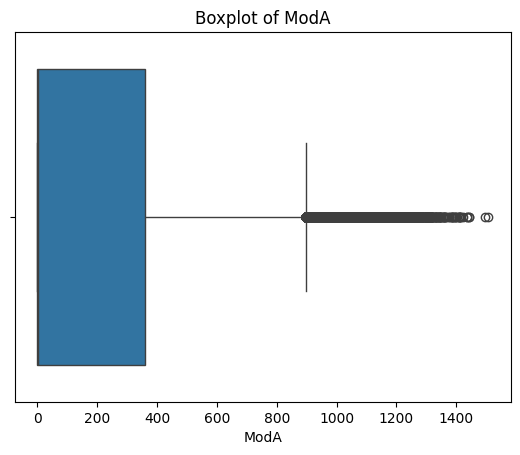

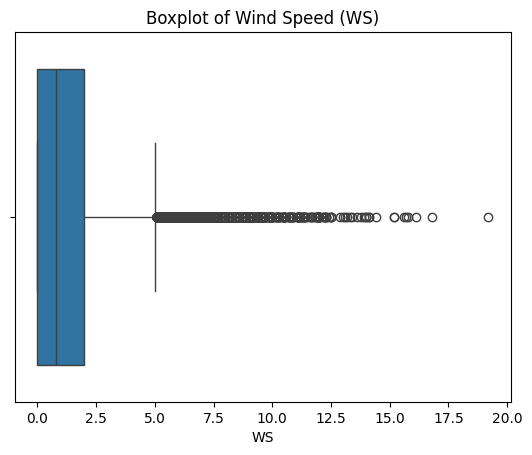

In [13]:
#Visualize Outliers (Optional)
sns.boxplot(x=data['ModA'])
plt.title('Boxplot of ModA')
plt.show()

sns.boxplot(x=data['WS'])
plt.title('Boxplot of Wind Speed (WS)')
plt.show()

## Time Series Analysis

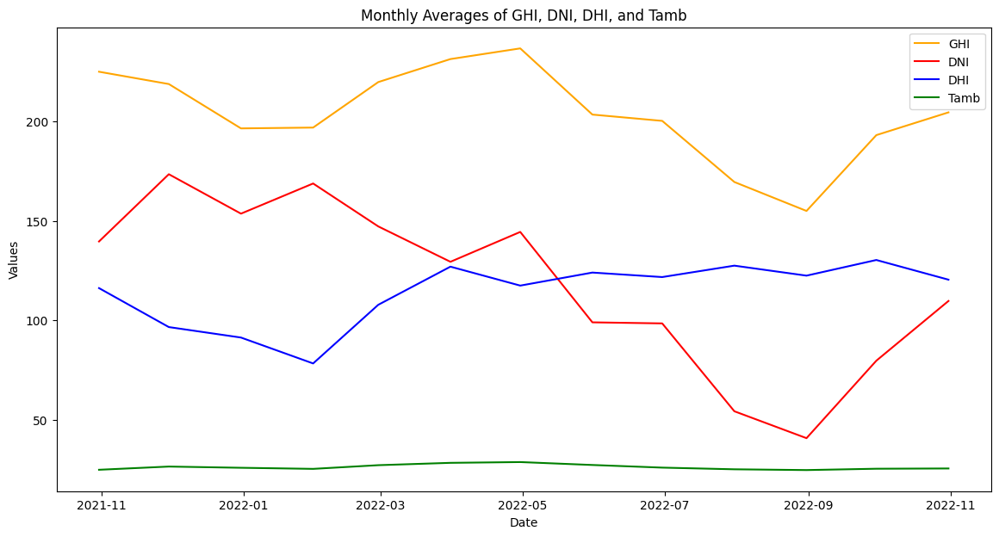

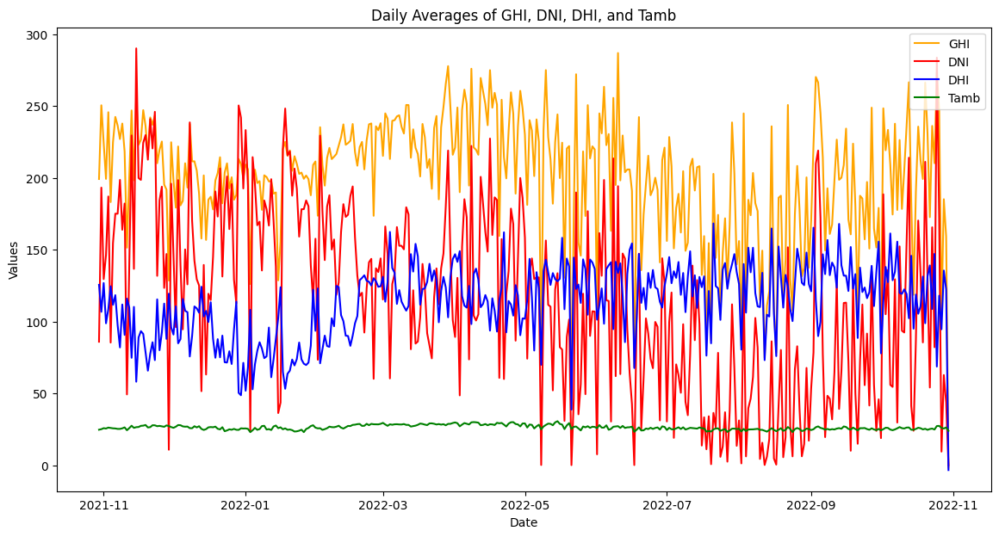

In [14]:
data['Timestamp'] = pd.to_datetime(data['Timestamp'])
data.set_index('Timestamp', inplace=True)

monthly_data = data.resample('M').mean()  # Monthly average
daily_data = data.resample('D').mean()    # Daily average
hourly_data = data.resample('H').mean()   # Hourly average

# Plotting Monthly Data
plt.figure(figsize=(14, 7))
plt.plot(monthly_data.index, monthly_data['GHI'], label='GHI', color='orange')
plt.plot(monthly_data.index, monthly_data['DNI'], label='DNI', color='red')
plt.plot(monthly_data.index, monthly_data['DHI'], label='DHI', color='blue')
plt.plot(monthly_data.index, monthly_data['Tamb'], label='Tamb', color='green')
plt.title('Monthly Averages of GHI, DNI, DHI, and Tamb')
plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()
plt.show()

# Plotting Daily Data
plt.figure(figsize=(14, 7))
plt.plot(daily_data.index, daily_data['GHI'], label='GHI', color='orange')
plt.plot(daily_data.index, daily_data['DNI'], label='DNI', color='red')
plt.plot(daily_data.index, daily_data['DHI'], label='DHI', color='blue')
plt.plot(daily_data.index, daily_data['Tamb'], label='Tamb', color='green')
plt.title('Daily Averages of GHI, DNI, DHI, and Tamb')
plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()
plt.show()

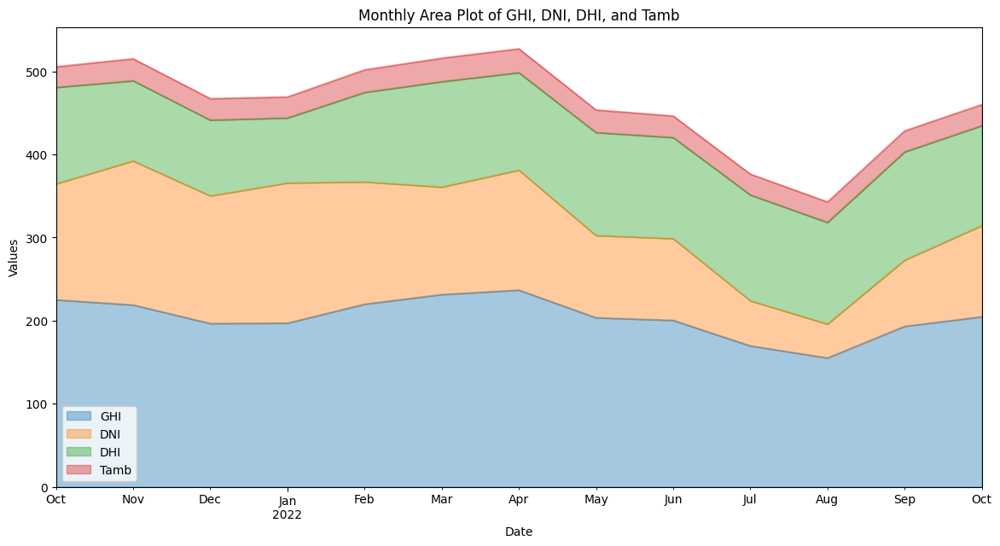

In [15]:
# Area Plot for Monthly Data
monthly_data[['GHI', 'DNI', 'DHI', 'Tamb']].plot.area(figsize=(14, 7), alpha=0.4)
plt.title('Monthly Area Plot of GHI, DNI, DHI, and Tamb')
plt.xlabel('Date')
plt.ylabel('Values')
plt.show()

# # Area Plot for Daily Data
# daily_data[['GHI', 'DNI', 'DHI', 'Tamb']].plot.area(figsize=(14, 7), alpha=0.4)
# plt.title('Daily Area Plot of GHI, DNI, DHI, and Tamb')
# plt.xlabel('Date')
# plt.ylabel('Values')
# plt.show()


## Correlation Analysis

In [16]:
correlation_matrix = data[['GHI', 'DNI', 'DHI', 'TModA', 'TModB', 'WS', 'WSgust', 'WD']].corr()
print(correlation_matrix)


             GHI       DNI       DHI     TModA     TModB        WS    WSgust  \
GHI     1.000000  0.869108  0.865815  0.923092  0.912260  0.371309  0.411449   
DNI     0.869108  1.000000  0.536710  0.816449  0.808194  0.311493  0.342094   
DHI     0.865815  0.536710  1.000000  0.808479  0.807551  0.347216  0.385978   
TModA   0.923092  0.816449  0.808479  1.000000  0.993228  0.435944  0.474257   
TModB   0.912260  0.808194  0.807551  0.993228  1.000000  0.455200  0.490846   
WS      0.371309  0.311493  0.347216  0.435944  0.455200  1.000000  0.973939   
WSgust  0.411449  0.342094  0.385978  0.474257  0.490846  0.973939  1.000000   
WD      0.404333  0.315941  0.403761  0.459756  0.482911  0.566228  0.627186   

              WD  
GHI     0.404333  
DNI     0.315941  
DHI     0.403761  
TModA   0.459756  
TModB   0.482911  
WS      0.566228  
WSgust  0.627186  
WD      1.000000  


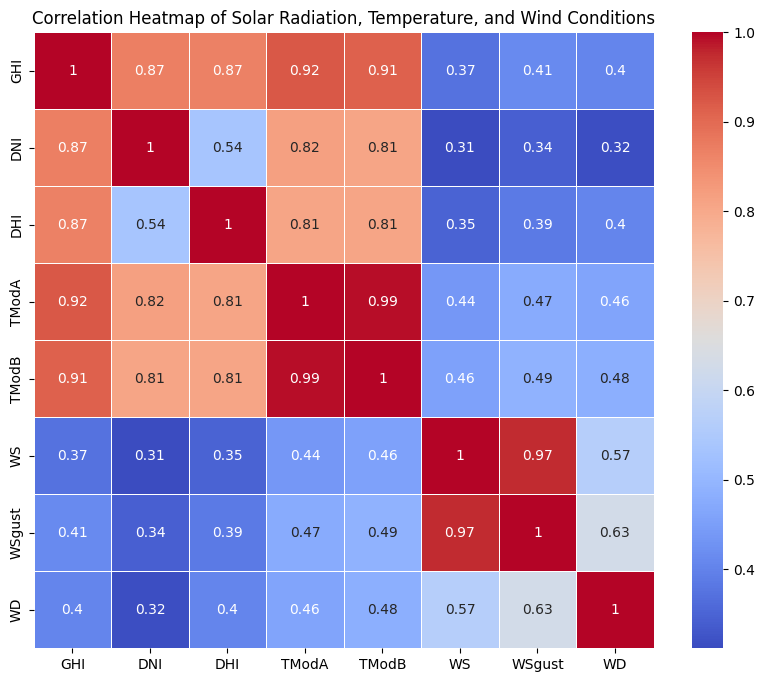

In [17]:
#Plot a Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap of Solar Radiation, Temperature, and Wind Conditions')
plt.show()

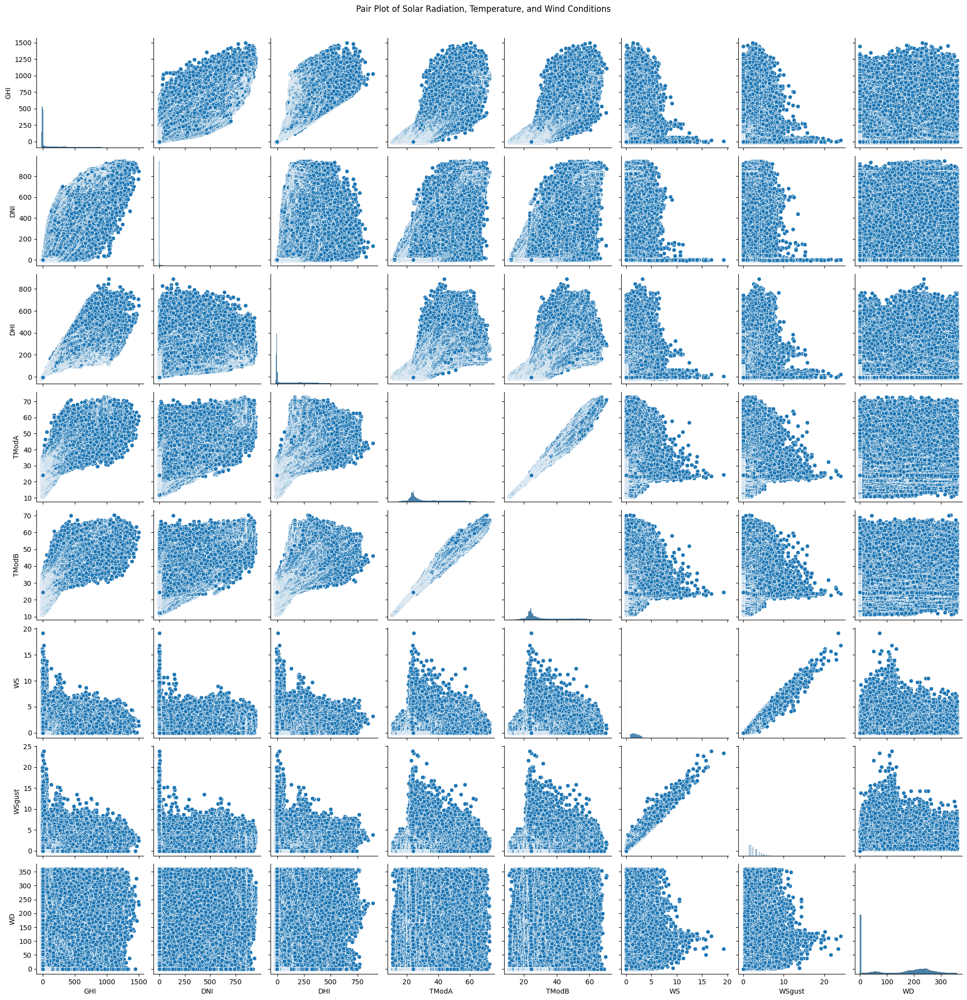

In [18]:
#Pair Plots
sns.pairplot(data[['GHI', 'DNI', 'DHI', 'TModA', 'TModB', 'WS', 'WSgust', 'WD']])
plt.suptitle('Pair Plot of Solar Radiation, Temperature, and Wind Conditions', y=1.02)
plt.show()

In [19]:
# #Scatter Matrix for Wind Conditions and Solar Irradiance
# scatter_matrix(data[['GHI', 'DNI', 'DHI', 'WS', 'WSgust', 'WD']], figsize=(12, 12), alpha=0.7, diagonal='kde')
# plt.suptitle('Scatter Matrix of Wind Conditions and Solar Irradiance', y=1.02)
# plt.show()

## 	Wind Analysis

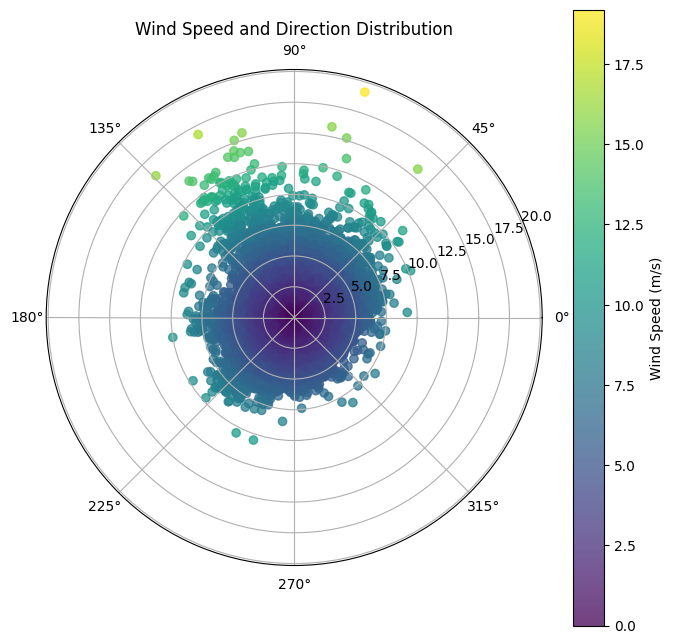

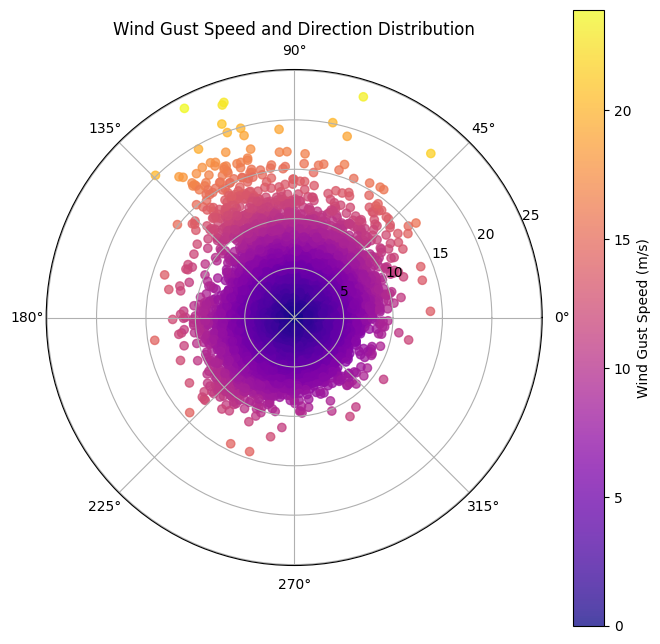

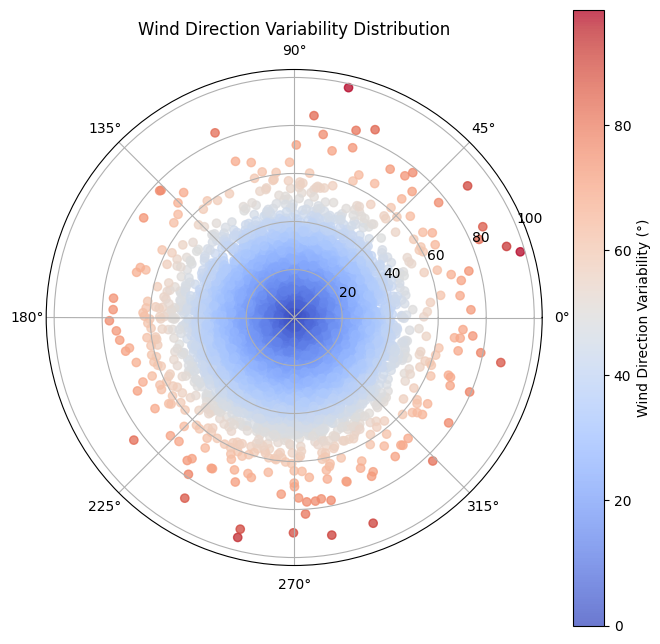

In [20]:
# Convert the wind direction (WD) from degrees to radians since polar plots in Matplotlib require angles in radians.
data['WD_radians'] = np.deg2rad(data['WD'])

#Create a Polar Plot for Wind Speed and Direction
plt.figure(figsize=(8, 8))
plt.subplot(projection='polar')
plt.scatter(data['WD_radians'], data['WS'], c=data['WS'], cmap='viridis', alpha=0.75)
plt.colorbar(label='Wind Speed (m/s)')
plt.title('Wind Speed and Direction Distribution')
plt.show()


# Plot Wind Gusts
plt.figure(figsize=(8, 8))
plt.subplot(projection='polar')
plt.scatter(data['WD_radians'], data['WSgust'], c=data['WSgust'], cmap='plasma', alpha=0.75)
plt.colorbar(label='Wind Gust Speed (m/s)')
plt.title('Wind Gust Speed and Direction Distribution')
plt.show()

#Analyze Wind Direction Variability
plt.figure(figsize=(8, 8))
plt.subplot(projection='polar')
plt.scatter(data['WD_radians'], data['WDstdev'], c=data['WDstdev'], cmap='coolwarm', alpha=0.75)
plt.colorbar(label='Wind Direction Variability (°)')
plt.title('Wind Direction Variability Distribution')
plt.show()


## Temperature Analysis

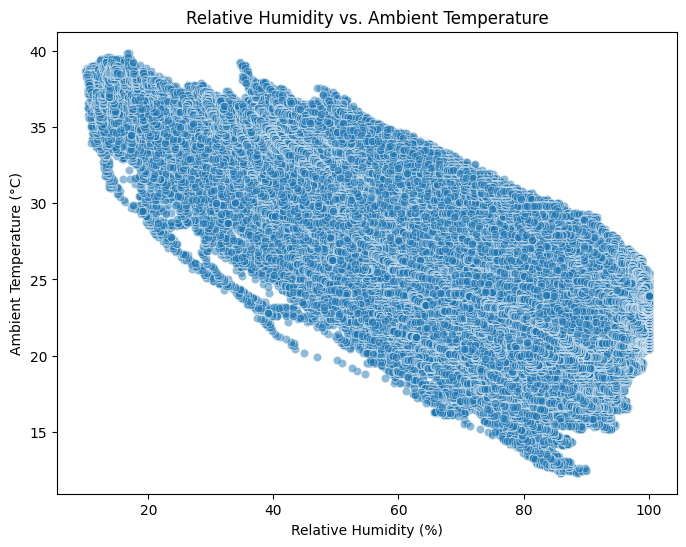

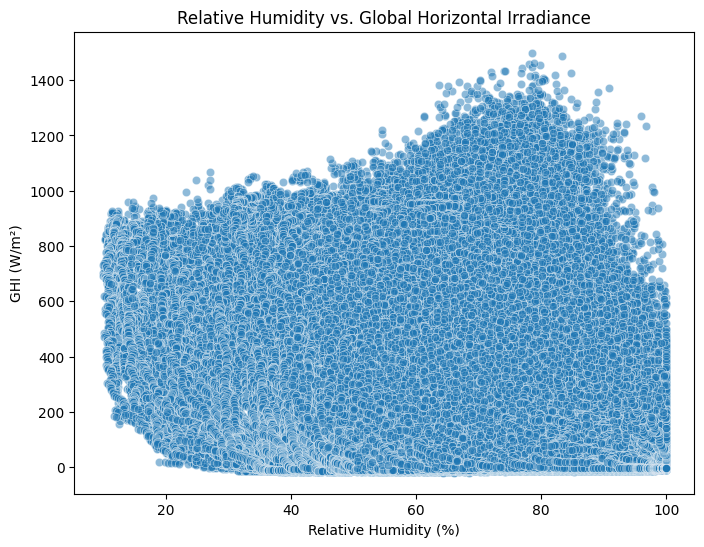

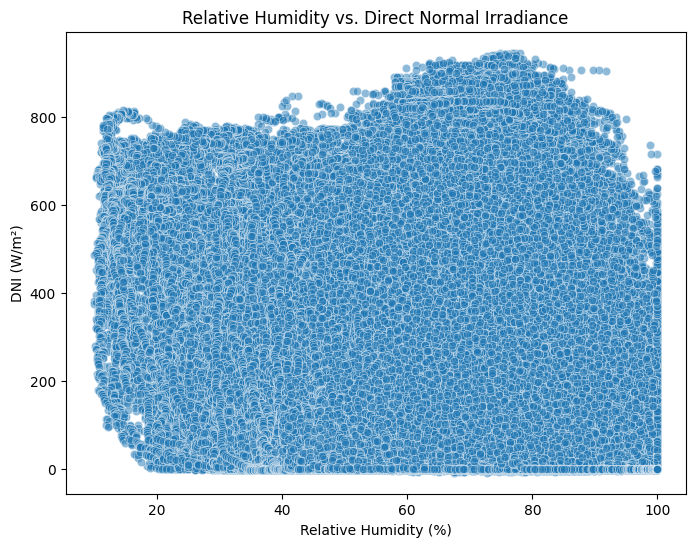

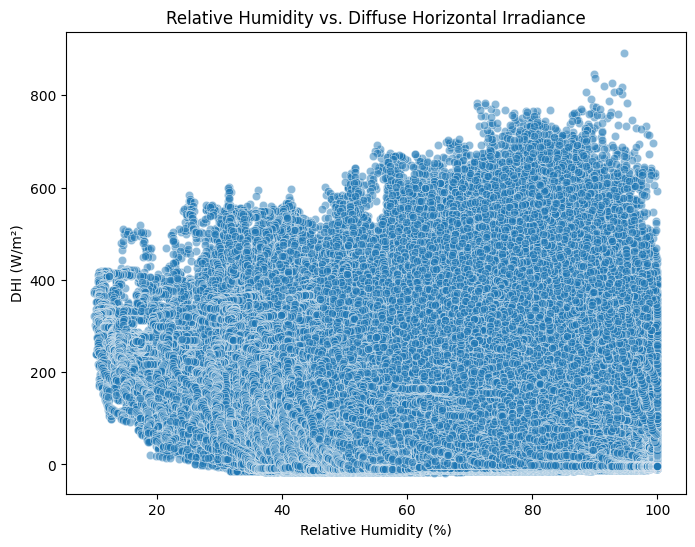

In [21]:
#Scatter Plots
# RH vs. Ambient Temperature (Tamb)
plt.figure(figsize=(8, 6))
sns.scatterplot(x='RH', y='Tamb', data=data, alpha=0.5)
plt.title('Relative Humidity vs. Ambient Temperature')
plt.xlabel('Relative Humidity (%)')
plt.ylabel('Ambient Temperature (°C)')
plt.show()

# RH vs. Global Horizontal Irradiance (GHI)
plt.figure(figsize=(8, 6))
sns.scatterplot(x='RH', y='GHI', data=data, alpha=0.5)
plt.title('Relative Humidity vs. Global Horizontal Irradiance')
plt.xlabel('Relative Humidity (%)')
plt.ylabel('GHI (W/m²)')
plt.show()

# RH vs. Direct Normal Irradiance (DNI)
plt.figure(figsize=(8, 6))
sns.scatterplot(x='RH', y='DNI', data=data, alpha=0.5)
plt.title('Relative Humidity vs. Direct Normal Irradiance')
plt.xlabel('Relative Humidity (%)')
plt.ylabel('DNI (W/m²)')
plt.show()

# RH vs. Diffuse Horizontal Irradiance (DHI)
plt.figure(figsize=(8, 6))
sns.scatterplot(x='RH', y='DHI', data=data, alpha=0.5)
plt.title('Relative Humidity vs. Diffuse Horizontal Irradiance')
plt.xlabel('Relative Humidity (%)')
plt.ylabel('DHI (W/m²)')
plt.show()

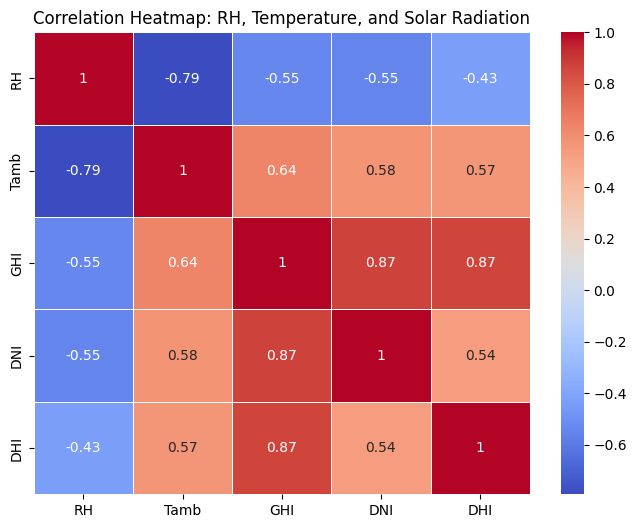

In [22]:
#Heatmap for Correlation Analysis
correlation_matrix = data[['RH', 'Tamb', 'GHI', 'DNI', 'DHI']].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap: RH, Temperature, and Solar Radiation')
plt.show()


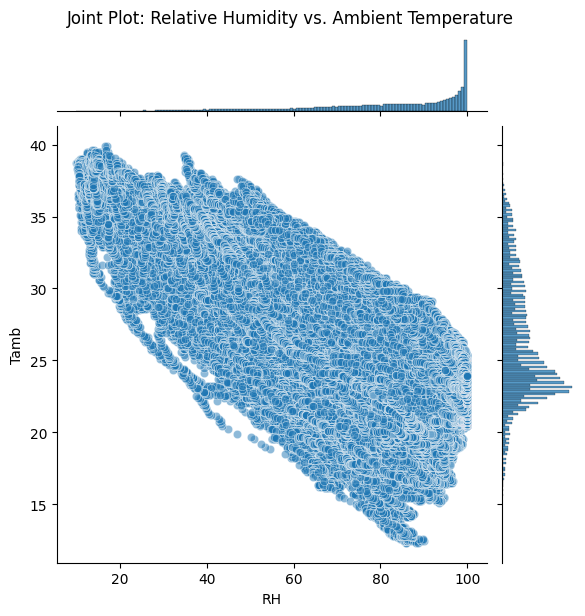

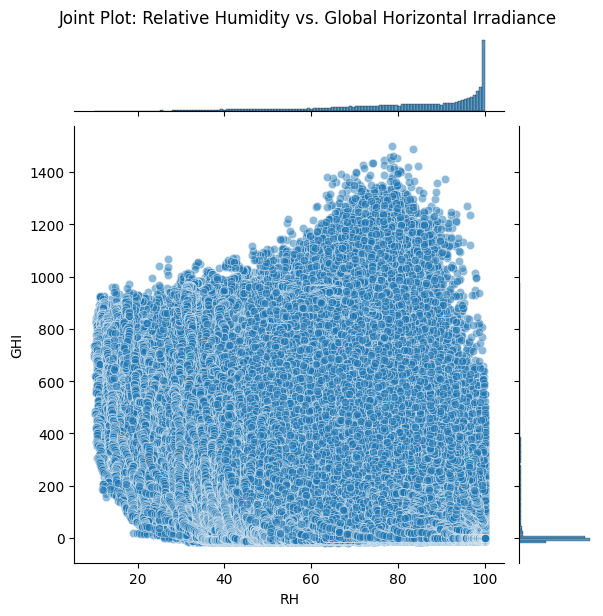

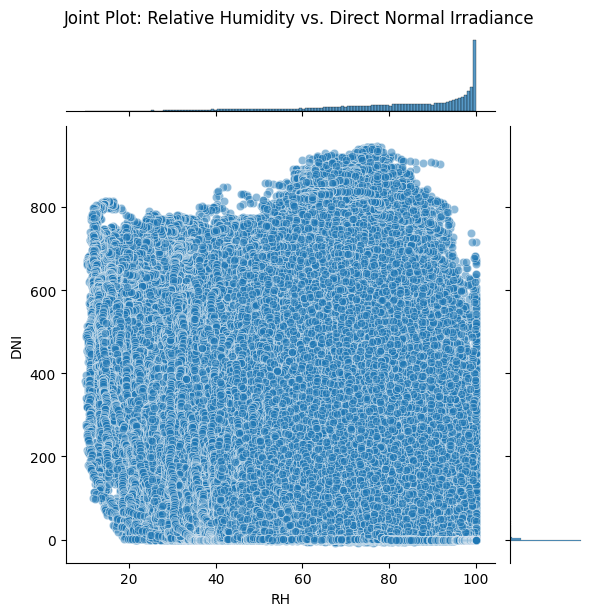

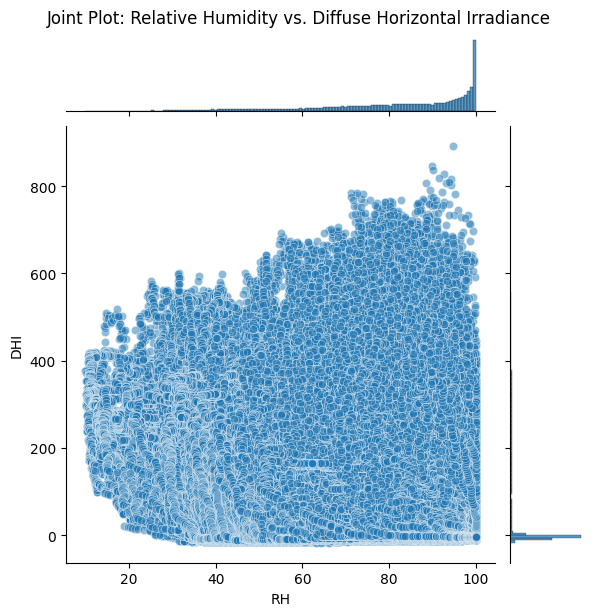

In [23]:
# Joint Plots
# RH vs. Tamb
sns.jointplot(x='RH', y='Tamb', data=data, kind='scatter', alpha=0.5)
plt.suptitle('Joint Plot: Relative Humidity vs. Ambient Temperature', y=1.02)
plt.show()

# RH vs. GHI
sns.jointplot(x='RH', y='GHI', data=data, kind='scatter', alpha=0.5)
plt.suptitle('Joint Plot: Relative Humidity vs. Global Horizontal Irradiance', y=1.02)
plt.show()

# RH vs. DNI
sns.jointplot(x='RH', y='DNI', data=data, kind='scatter', alpha=0.5)
plt.suptitle('Joint Plot: Relative Humidity vs. Direct Normal Irradiance', y=1.02)
plt.show()

# RH vs. DHI
sns.jointplot(x='RH', y='DHI', data=data, kind='scatter', alpha=0.5)
plt.suptitle('Joint Plot: Relative Humidity vs. Diffuse Horizontal Irradiance', y=1.02)
plt.show()


## Histograms

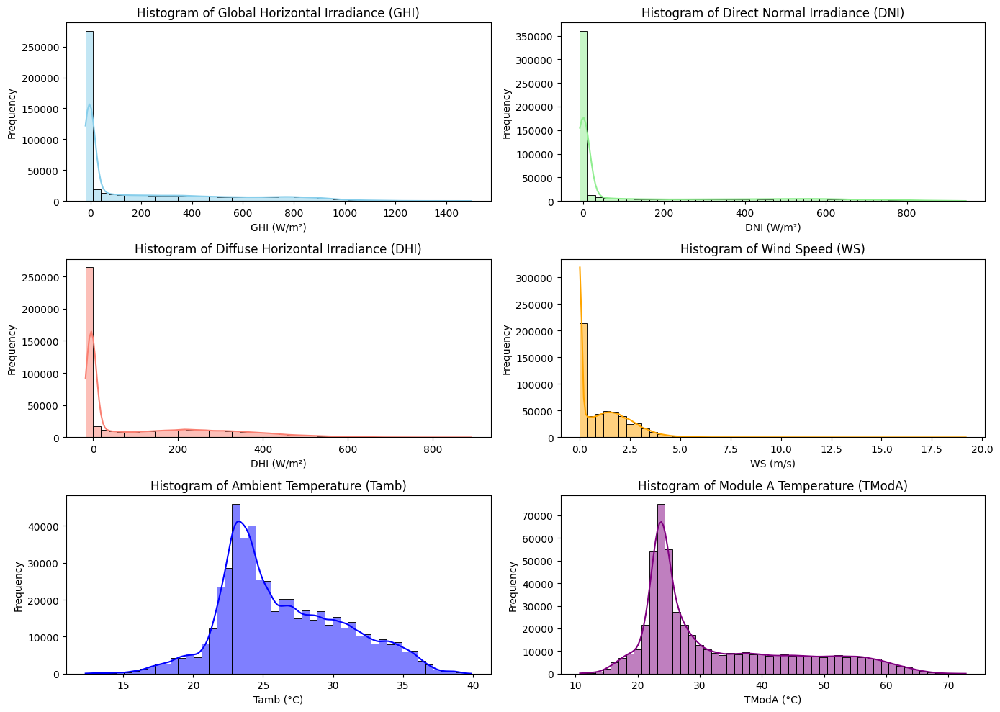

In [24]:
# Set up the figure and axes
plt.figure(figsize=(14, 10))

# Histogram for Global Horizontal Irradiance (GHI)
plt.subplot(3, 2, 1)
sns.histplot(data['GHI'], bins=50, kde=True, color='skyblue')
plt.title('Histogram of Global Horizontal Irradiance (GHI)')
plt.xlabel('GHI (W/m²)')
plt.ylabel('Frequency')

# Histogram for Direct Normal Irradiance (DNI)
plt.subplot(3, 2, 2)
sns.histplot(data['DNI'], bins=50, kde=True, color='lightgreen')
plt.title('Histogram of Direct Normal Irradiance (DNI)')
plt.xlabel('DNI (W/m²)')
plt.ylabel('Frequency')

# Histogram for Diffuse Horizontal Irradiance (DHI)
plt.subplot(3, 2, 3)
sns.histplot(data['DHI'], bins=50, kde=True, color='salmon')
plt.title('Histogram of Diffuse Horizontal Irradiance (DHI)')
plt.xlabel('DHI (W/m²)')
plt.ylabel('Frequency')

# Histogram for Wind Speed (WS)
plt.subplot(3, 2, 4)
sns.histplot(data['WS'], bins=50, kde=True, color='orange')
plt.title('Histogram of Wind Speed (WS)')
plt.xlabel('WS (m/s)')
plt.ylabel('Frequency')

# Histogram for Ambient Temperature (Tamb)
plt.subplot(3, 2, 5)
sns.histplot(data['Tamb'], bins=50, kde=True, color='blue')
plt.title('Histogram of Ambient Temperature (Tamb)')
plt.xlabel('Tamb (°C)')
plt.ylabel('Frequency')

# Histogram for Module A Temperature (TModA)
plt.subplot(3, 2, 6)
sns.histplot(data['TModA'], bins=50, kde=True, color='purple')
plt.title('Histogram of Module A Temperature (TModA)')
plt.xlabel('TModA (°C)')
plt.ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()


## Z-Score Analysis

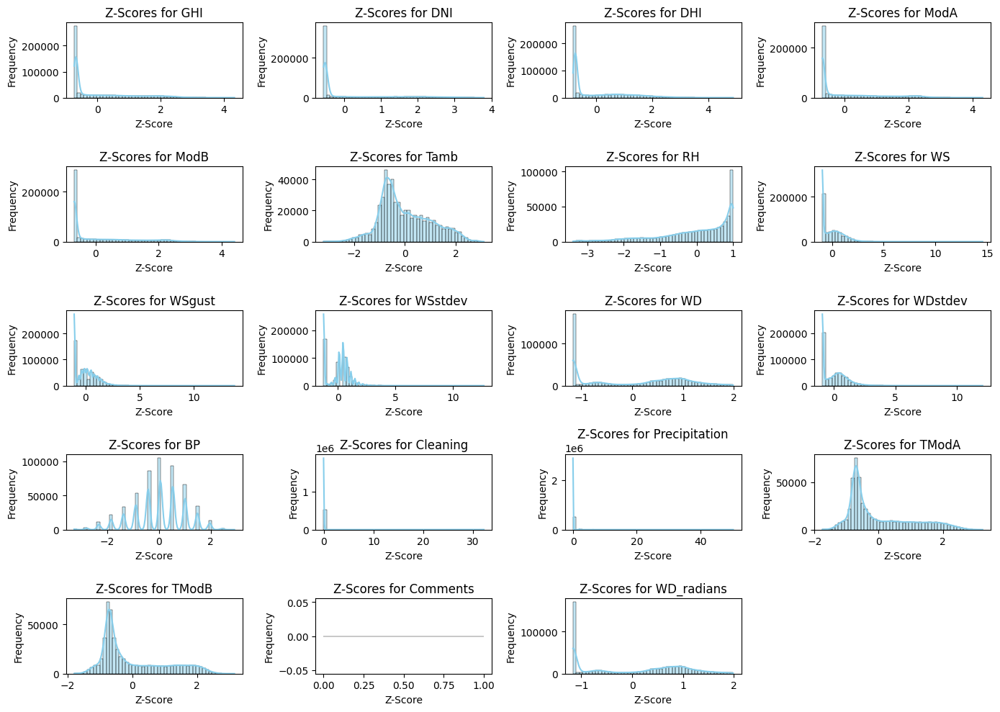

In [25]:
# Calculate Z-scores for all numeric columns
z_scores = pd.DataFrame(stats.zscore(data.select_dtypes(include=[np.number])), columns=data.select_dtypes(include=[np.number]).columns)

# Define the threshold for identifying outliers
threshold = 3

# Identify outliers
outliers = (np.abs(z_scores) > threshold).astype(int)

# Add Z-scores and outliers to the original dataframe
df_z_scores = data.copy()
df_z_scores[z_scores.columns] = z_scores
df_z_scores[outliers.columns] = outliers

# Determine the number of columns to plot
num_columns = len(z_scores.columns)

# Calculate the number of rows and columns for the subplot grid
num_rows = int(np.ceil(num_columns / 4))  # 4 columns per row

# Plot histograms of Z-scores
plt.figure(figsize=(14, 10))

for i, column in enumerate(z_scores.columns):
    plt.subplot(num_rows, 4, i + 1)  # Adjust the grid size dynamically
    sns.histplot(z_scores[column], bins=50, kde=True, color='skyblue')
    plt.title(f'Z-Scores for {column}')
    plt.xlabel('Z-Score')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

## Bubble charts

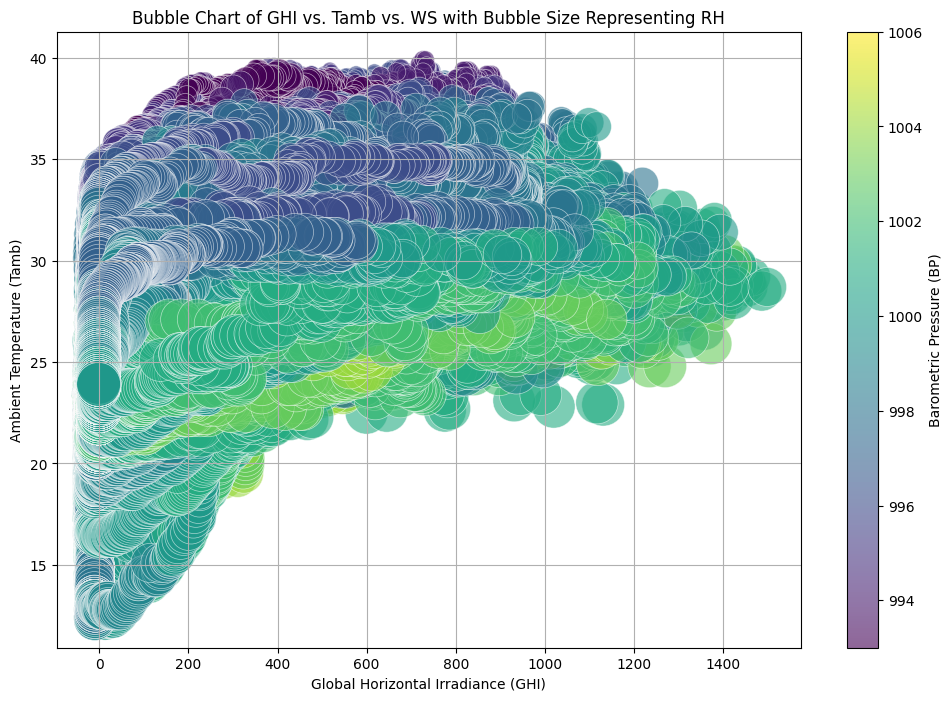

In [26]:
# Extract relevant columns
data = data[['GHI', 'Tamb', 'WS', 'RH', 'BP']]


# Plotting
plt.figure(figsize=(12, 8))

# Create bubble chart
plt.scatter(
    data['GHI'],         # X-axis
    data['Tamb'],        # Y-axis
    s=data['RH'] * 10,   # Bubble size (scaled for better visibility)
    c=data['BP'],        # Bubble color (optional, can represent another variable)
    cmap='viridis',      # Color map
    alpha=0.6,           # Transparency
    edgecolors='w',      # Edge color
    linewidth=0.5       # Edge width
)

# Add labels and title
plt.xlabel('Global Horizontal Irradiance (GHI)')
plt.ylabel('Ambient Temperature (Tamb)')
plt.title('Bubble Chart of GHI vs. Tamb vs. WS with Bubble Size Representing RH')
plt.colorbar(label='Barometric Pressure (BP)')  # Color bar for bubble color if used
plt.grid(True)

# Show plot
plt.show()


## Data Cleaning

In [27]:
# Check for missing values
missing_values = data.isnull().sum()
print(missing_values)

# Drop the "Comments" column if it exists and is entirely null
if 'Comments' in data.columns and data['Comments'].isnull().all():
    data.drop(columns=['Comments'], inplace=True)

# Impute missing values with mean or median
data.fillna(data.mean(), inplace=True)
# Alternatively, you can use median or a more sophisticated method depending on the data distribution
# data.fillna(data.median(), inplace=True)

# Drop rows with missing values in crucial columns
# data.dropna(subset=['GHI', 'DNI', 'DHI'], inplace=True)

# Remove extreme outliers based on Z-scores
df_cleaned = data[(np.abs(stats.zscore(data.select_dtypes(include=[np.number]))) < 3).all(axis=1)]

# Re-check for missing values
missing_values_after_cleaning = df_cleaned.isnull().sum()
print(missing_values_after_cleaning)

# Describe the cleaned dataset
print(df_cleaned.describe())




GHI     0
Tamb    0
WS      0
RH      0
BP      0
dtype: int64
GHI     0
Tamb    0
WS      0
RH      0
BP      0
dtype: int64
                 GHI           Tamb             WS             RH  \
count  513459.000000  513459.000000  513459.000000  513459.000000   
mean      193.075632      26.179428       1.091648      80.233924   
std       289.066976       4.278728       1.153716      19.544360   
min       -15.900000      13.200000       0.000000      17.900000   
25%        -3.100000      23.100000       0.000000      69.400000   
50%        -0.300000      25.200000       0.800000      85.900000   
75%       345.000000      29.200000       1.900000      96.900000   
max      1097.000000      39.100000       4.800000     100.000000   

                  BP  
count  513459.000000  
mean      999.916095  
std         2.070639  
min       994.000000  
25%       999.000000  
50%      1000.000000  
75%      1001.000000  
max      1006.000000  
